# Time series analysis: Digital Earth Australia Fractional Vegetation Cover data 

* Author: Krishna Lamsal
* Date created: 2024 Oct 15
* Date updated: 2024 Nov 11, 2025 Feb 04

## 📌 Project Overview
This project analyzes **Digital Earth Australia (DEA) Fractional Vegetation Cover (FVC)** dataset using **STAC API** for remote sensing time-series analysis. The script retrieves, processes, and visualizes **historical FVC trends** using masking, spatial analysis, and statistical techniques.

## 🚀 Features
- **STAC API Querying**: Retrieve DEA FVC dataset efficiently.
- **Cloud Masking**: Apply Landsat Fmask for data quality enhancement.
- **Geospatial Clipping**: Extract site-specific data.
- **Time Series Analysis**: Smoothing, decomposition, and trend detection.
- **Bayesian and Statistical Tests**: Mann-Kendall Trend analysis, BEAST Change detection.
- **Advanced Visualization**: Polar and Spiral Plots for seasonal assessment.


# Find, Load, and Visualise Earth Observation Imagery DEA Fractional Cover data

This notebook demonstrates how to find, load, and visualise DEA FVC dataset using cloud native approaches!

The notebook demonstrates how to find images from the Digital Earth Australia STAC catalog, load them using `odc-stac`, and visualise them using extensions to xarray provided by `odc-geo`.

## Set up and load required libraries and extensions

The first step is to set up the required Python libraries and local imports.

* `odc.stac` and `pystac_client` are used to access Digital Earth Australia's STAC catalog
* `numpy` is used to manipulate data
* `odc.geo.xr` enables additional functionality for xarrays

In [1]:
import os
import numpy as np
import pandas as pd 
import calendar

import xarray as xr
import dask 
import rioxarray  

import rasterio
from rasterio.session import AWSSession
import geopandas as gpd
from shapely.geometry import Polygon

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as patches

import scipy.stats
from scipy.signal import savgol_filter

from sklearn.preprocessing import RobustScaler


In [2]:
# # pip install dea-tools
# import sys
from datacube.utils import masking
# from dea_tools.spatial import xr_rasterize
# from dea_tools.datahandling import wofs_fuser
# from dea_tools.plotting import rgb
# from dea_tools.datahandling import nearest
# from dea_tools.dask import create_local_dask_cluster

In [3]:
import pystac_client
import odc.stac
from odc.stac import configure_s3_access, load
import odc.geo.xr  # noqa: F401

In [4]:
pd.set_option("display.max_columns", 10)
pd.set_option("display.max_rows", 100)

The second step is to start a Dask client.

Dask supports local parallel processing and can help speed up computation times.

In [5]:
from dask.distributed import Client as DaskClient

dask_client = DaskClient()
dask_client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 11
Total threads: 22,Total memory: 31.46 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:60505,Workers: 11
Dashboard: http://127.0.0.1:8787/status,Total threads: 22
Started: Just now,Total memory: 31.46 GiB
Comm: tcp://127.0.0.1:60563,Total threads: 2
Dashboard: http://127.0.0.1:60585/status,Memory: 2.86 GiB
Nanny: tcp://127.0.0.1:60512,


## Part 1: Find the dataset/catalogue

### 1.1 Connecting to the catalog

In [6]:
catalog = pystac_client.Client.open("https://explorer.dea.ga.gov.au/stac")

In [7]:
# Configure settings for reading from DEA's STAC
configure_s3_access(
    cloud_defaults=True,
    aws_unsigned=True,
)

### 1.2 Selecting an area to query

In [8]:
# APIError: {"code": 400, "name": "Bad Request", "description": "Expected bbox of size 4. [min lon, min lat, max long, max lat]"}

# Step 1: Define the polygon coordinates (single polygon)

# calperum SASMDD0001
bbox1 = [140.5874917000001, -34.00265555999997,
    140.58738890000006, -34.00266110999994,
    140.5865222000001, -34.00266110999997,
    140.58640830000002, -34.002658329999974,
    140.58641110000008, -34.00175832999996,
    140.58652500000005, -34.00175277999994,
    140.5867389000001, -34.00175277999998,
    140.58695280000003, -34.00175278,
    140.5871694000001, -34.00175555999993,
    140.58749440000008, -34.001761109999975,
    140.58749720000003, -34.002027779999935,
    140.58749720000003, -34.00238889,
    140.5874917000001, -34.00265555999997]

polygon_coords = [(bbox1[i], bbox1[i+1]) for i in range(0, len(bbox1)-1, 2)]  # Convert to (lon, lat) pairs

# Step 2: Create a Shapely polygon
polygon = Polygon(polygon_coords)
polygon
# Step 3: Get the bounding box of the polygon
bbox = polygon.bounds
bbox

(140.58640830000002,
 -34.00266110999997,
 140.58749720000003,
 -34.00175277999994)

##### 
Test to evaluate why selecting all pixels within bounding boxes may be inappropriate, and spatial masking needs to be performed

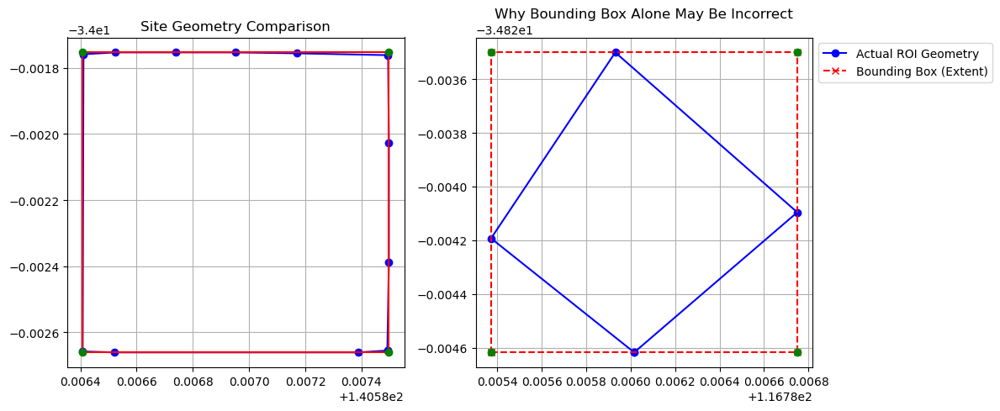

In [9]:
# Define first polygon (site geometry from KMZ) # calperum SAACHC0001
bbox1 = [140.5874917000001, -34.00265555999997,
    140.58738890000006, -34.00266110999994,
    140.5865222000001, -34.00266110999997,
    140.58640830000002, -34.002658329999974,
    140.58641110000008, -34.00175832999996,
    140.58652500000005, -34.00175277999994,
    140.5867389000001, -34.00175277999998,
    140.58695280000003, -34.00175278,
    140.5871694000001, -34.00175555999993,
    140.58749440000008, -34.001761109999975,
    140.58749720000003, -34.002027779999935,
    140.58749720000003, -34.00238889,
    140.5874917000001, -34.00265555999997]

coords1 = [(bbox1[i], bbox1[i + 1]) for i in range(0, len(bbox1), 2)]
polygon1 = Polygon(coords1)

min_lon1, min_lat1, max_lon1, max_lat1 = polygon1.bounds
rectangle_coords1 = [
    (min_lon1, min_lat1), (max_lon1, min_lat1),
    (max_lon1, max_lat1), (min_lon1, max_lat1), (min_lon1, min_lat1)
]
rectangle1 = Polygon(rectangle_coords1)

# Define second polygon (irregular site geometry)
# Define an example irregular polygon (actual ROI) - WAFWAR0007 

bbox2 = [
    116.786016, -34.82461799999992, 
    116.78537200000004, -34.82419300000001,
    116.785931, -34.823499999999974,  
    116.78675000000008, -34.824095999999976, 
    116.786016, -34.82461799999992
]

coords2 = [(bbox2[i], bbox2[i + 1]) for i in range(0, len(bbox2), 2)]
polygon2 = Polygon(coords2)

min_lon2, min_lat2, max_lon2, max_lat2 = polygon2.bounds
rectangle_coords2 = [
    (min_lon2, min_lat2), (max_lon2, min_lat2),
    (max_lon2, max_lat2), (min_lon2, max_lat2), (min_lon2, min_lat2)
]
rectangle2 = Polygon(rectangle_coords2)

# Create a 1x2 subplot layout
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot Site Geometry (KMZ-derived) in first subplot
ax1 = axes[0]
x1, y1 = polygon1.exterior.xy
# ax1.plot(x1, y1, 'o-', label='Site Geometry (KMZ-derived)', color='blue')
ax1.plot(x1, y1, 'o-', color='blue')
x_rect1, y_rect1 = rectangle1.exterior.xy
# ax1.plot(x_rect1, y_rect1, 'x--', label='Bounding Box (Min/Max Coordinates)', color='red')
ax1.plot(x_rect1, y_rect1, color='red')

ax1.scatter([min_lon1, max_lon1, min_lon1, max_lon1], [min_lat1, min_lat1, max_lat1, max_lat1], color='green', zorder=5)

ax1.set_title('Site Geometry Comparison')
# ax1.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax1.grid(True)

# Plot Bounding Box Issues in second subplot
ax2 = axes[1]
x2, y2 = polygon2.exterior.xy
ax2.plot(x2, y2, 'o-', label='Actual ROI Geometry', color='blue')

x_rect2, y_rect2 = rectangle2.exterior.xy
ax2.plot(x_rect2, y_rect2, 'x--', label='Bounding Box (Extent)', color='red')

ax2.scatter([min_lon2, max_lon2, min_lon2, max_lon2], [min_lat2, min_lat2, max_lat2, max_lat2], color='green', zorder=5)

ax2.set_title('Why Bounding Box Alone May Be Incorrect')
ax2.legend(loc='upper left', bbox_to_anchor=(1, 1))
ax2.grid(True)

# Adjust layout and show plot
plt.tight_layout()
plt.show()


##### EPSG selection
The core STAC API specification assumes input geometries (e.g., `bbox`, intersects `polygon`) are in GCS, for example EPSG:4326 (WGS84). If you provide geometries in a projected CRS, the server cannot interpret them correctly.

If you need to work with projected CRS (e.g., EPSG:32754), you must reproject the data after loading it because STAC APIs will always expect inputs in GCS (e.g., EPSG:4326).

In [10]:
# Step 4: Create a GeoDataFrame for the polygon (for clipping later)
gdf = gpd.GeoDataFrame({'geometry': [polygon]}, crs="EPSG:4326")
gdf

,geometry
0,"POLYGON ((140.58749 -34.00266, 140.58739 -34.0..."


In [11]:
# Adding ESRI satellite imagery as base layer 
# # Ensure gdf is already loaded and contains geometry
# gdf.explore()
gdf.explore(tiles="https://services.arcgisonline.com/arcgis/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",
            attr="ESRI Satellite")


### 1.3 Set year and month to query, choose collections and filters for FVC data

In [12]:
# Step 5: Connect to the STAC catalog
catalog = pystac_client.Client.open("https://explorer.dea.ga.gov.au/stac")

# Step 6: Build a STAC query for data between specific dates
start_date = "2010-01-01"
end_date = "2024-11-30"
collection = "ga_ls_fc_3"

query = catalog.search(
    collections=[collection],
    bbox=bbox,
    datetime=f"{start_date}/{end_date}"
)

# # Set up a filter query. The s2cloudless:cloud variable is a DEA-specific metadata field
# filter_query = "s2cloudless:cloud < 80"

### 1.4 Running the query to indentify matching FVC STAC items

In [13]:
# Step 7: Search the STAC catalog for all items matching the query
items = list(query.items())
if not items:
    raise ValueError("No items found for the given parameters")
    
print(f"Found: {len(items):d} datasets")

Found: 1788 datasets


In [14]:
items[0]

<Item id=c951de7b-5899-5529-8285-8cafe09925e9>

In [15]:
# Access the properties dictionary of the first item, which includes metadata such as acquisition date, instrument type, etc.
item_properties = items[0].properties
item_properties

{'title': 'ga_ls_fc_3_096083_2010-01-07_final',
 'gsd': 30.0,
 'created': '2010-01-07T00:18:22.161395Z',
 'gqa:abs_x': 0.37,
 'gqa:abs_y': 0.31,
 'gqa:cep90': 0.6,
 'proj:epsg': 32654,
 'fmask:snow': 0.0,
 'gqa:abs_xy': 0.48,
 'gqa:mean_x': -0.22,
 'gqa:mean_y': 0.17,
 'proj:shape': [7081, 8131],
 'platform': 'landsat-7',
 'fmask:clear': 95.18668144553241,
 'fmask:cloud': 4.012428302169772,
 'fmask:water': 0.2945648825391513,
 'gqa:mean_xy': 0.28,
 'odc:product': 'ga_ls_fc_3',
 'gqa:stddev_x': 0.77,
 'gqa:stddev_y': 0.46,
 'odc:producer': 'ga.gov.au',
 'instruments': ['etm'],
 'gqa:stddev_xy': 0.9,
 'eo:cloud_cover': 4.012428302169772,
 'view:sun_azimuth': 80.57682288,
 'proj:transform': [30.0,
  0.0,
  369285.0,
  0.0,
  -30.0,
  -3563685.0,
  0.0,
  0.0,
  1.0],
 'landsat:wrs_row': 83,
 'odc:file_format': 'GeoTIFF',
 'odc:region_code': '096083',
 'end_datetime': '2010-01-07T00:18:35.884868Z',
 'view:sun_elevation': 56.57304912,
 'landsat:wrs_path': 96,
 'start_datetime': '2010-01-07T

In [16]:
# Access the assets dictionary of the first item, which contains URLs and descriptions for all the data files (assets) associated with this item
item_assets = items[0].assets
item_assets

{'bs': <Asset href=s3://dea-public-data/derivative/ga_ls_fc_3/2-5-0/096/083/2010/01/07/ga_ls_fc_3_096083_2010-01-07_final_bs.tif>,
 'pv': <Asset href=s3://dea-public-data/derivative/ga_ls_fc_3/2-5-0/096/083/2010/01/07/ga_ls_fc_3_096083_2010-01-07_final_pv.tif>,
 'ue': <Asset href=s3://dea-public-data/derivative/ga_ls_fc_3/2-5-0/096/083/2010/01/07/ga_ls_fc_3_096083_2010-01-07_final_ue.tif>,
 'npv': <Asset href=s3://dea-public-data/derivative/ga_ls_fc_3/2-5-0/096/083/2010/01/07/ga_ls_fc_3_096083_2010-01-07_final_npv.tif>}



You can convert the entire collection of STAC items from the query into a GeoJSON FeatureCollection dictionary, and access the property such as cloud cover percentage, cloud shadow, etc. of each item. 

In [17]:
# Alternatively, convert the entire collection of STAC items from the query into a GeoJSON FeatureCollection dictionary
stac_json = query.item_collection_as_dict()
stac_json

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'stac_version': '1.0.0',
   'id': 'c951de7b-5899-5529-8285-8cafe09925e9',
   'properties': {'title': 'ga_ls_fc_3_096083_2010-01-07_final',
    'gsd': 30.0,
    'created': '2010-01-07T00:18:22.161395Z',
    'gqa:abs_x': 0.37,
    'gqa:abs_y': 0.31,
    'gqa:cep90': 0.6,
    'proj:epsg': 32654,
    'fmask:snow': 0.0,
    'gqa:abs_xy': 0.48,
    'gqa:mean_x': -0.22,
    'gqa:mean_y': 0.17,
    'proj:shape': [7081, 8131],
    'platform': 'landsat-7',
    'fmask:clear': 95.18668144553241,
    'fmask:cloud': 4.012428302169772,
    'fmask:water': 0.2945648825391513,
    'gqa:mean_xy': 0.28,
    'odc:product': 'ga_ls_fc_3',
    'gqa:stddev_x': 0.77,
    'gqa:stddev_y': 0.46,
    'odc:producer': 'ga.gov.au',
    'instruments': ['etm'],
    'gqa:stddev_xy': 0.9,
    'eo:cloud_cover': 4.012428302169772,
    'view:sun_azimuth': 80.57682288,
    'proj:transform': [30.0,
     0.0,
     369285.0,
     0.0,
     -30.0,
     -3563685.0,

In [18]:
# Access the 'fmask:cloud' property of the first item
# This property contains the cloud cover percentage
items[0].properties['fmask:cloud']

4.012428302169772

In [19]:
# Convert the GeoJSON FeatureCollection into a GeoDataFrame
gdf_json = gpd.GeoDataFrame.from_features(stac_json, "epsg:4326")

In [20]:
gdf_json.columns

Index(['geometry', 'title', 'gsd', 'created', 'gqa:abs_x', 'gqa:abs_y',
       'gqa:cep90', 'proj:epsg', 'fmask:snow', 'gqa:abs_xy', 'gqa:mean_x',
       'gqa:mean_y', 'proj:shape', 'platform', 'fmask:clear', 'fmask:cloud',
       'fmask:water', 'gqa:mean_xy', 'odc:product', 'gqa:stddev_x',
       'gqa:stddev_y', 'odc:producer', 'instruments', 'gqa:stddev_xy',
       'eo:cloud_cover', 'view:sun_azimuth', 'proj:transform',
       'landsat:wrs_row', 'odc:file_format', 'odc:region_code', 'end_datetime',
       'view:sun_elevation', 'landsat:wrs_path', 'start_datetime',
       'fmask:cloud_shadow', 'odc:product_family', 'odc:dataset_version',
       'dea:dataset_maturity', 'gqa:iterative_mean_x', 'gqa:iterative_mean_y',
       'gqa:iterative_mean_xy', 'odc:collection_number',
       'gqa:iterative_stddev_x', 'gqa:iterative_stddev_y',
       'odc:naming_conventions', 'gqa:iterative_stddev_xy',
       'gqa:abs_iterative_mean_x', 'gqa:abs_iterative_mean_y',
       'landsat:landsat_scene_id', 

In [21]:
# Visualize the GeoDataFrame interactively using the explore() method
gdf_json.explore(fill = False)

<Axes: >

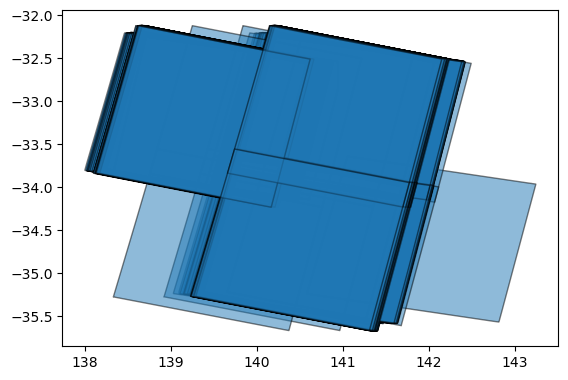

In [22]:
# Convert features to a GeoDataFrame
gdf_tile = gpd.GeoDataFrame.from_features(gdf_json['geometry'])

# Plot the footprints of each dataset
gdf_tile.plot(alpha=0.5, edgecolor='black')

<Axes: >

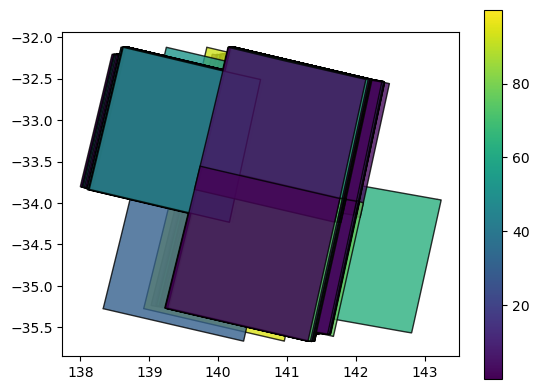

In [23]:
# Colour features by cloud cover
gdf_json.plot(column='eo:cloud_cover',
         cmap='viridis',
         alpha=0.8,
         edgecolor='black',
         legend=True)

### 1.5 Generate Fmask info from FCV data containing: parent Landsat info and product id to extract fmask layer and perform data search and load using DEA stac

To track FVC relaibly over time, invalid pixels should be masked out. Two approaches: 
1. Apply a cloud and water mask as stated in DEA's Fractional Cover notebook (https://knowledge.dea.ga.gov.au/notebooks/DEA_products/DEA_Fractional_Cover/): Use DEA Water observations product as a mask layer. In principle, the number of observations that use Water observation (mask as stated in DEA web) and FVC data should be same, however this is not the case.
2. Use Fmask from parent Landsat image of matching date and time from which FVC product is derived as a mask layer.  
This step involved: 
    1. Finding parent landsat image with its title, platform, landsat_scene_id and landsat_product_id
    2. Construct the search query for the Landsat scene
    3. Extract Fmask layer
However, users must ensure acquisition time are matched. 

In [24]:
# Extract the desired properties from each pystac.Item
data = []
for item in items:
    properties = item.properties  # Access properties attribute
    data.append({
        "title": properties.get("title"),
        "platform": properties.get("platform"),
        "landsat_scene_id": properties.get("landsat:landsat_scene_id"),
        "landsat_product_id": properties.get("landsat:landsat_product_id"),
    })

# Create a DataFrame
df = pd.DataFrame(data)

# Display the resulting table
df.head(75)

,title,platform,landsat_scene_id,landsat_product_id
0,ga_ls_fc_3_096083_2010-01-07_final,landsat-7,LE70960832010007ASA00,LE07_L1TP_096083_20100107_20161216_01_T1
1,ga_ls_fc_3_096084_2010-01-07_final,landsat-7,LE70960842010007ASN00,LE07_L1TP_096084_20100107_20161216_01_T1
2,ga_ls_fc_3_097083_2010-01-14_final,landsat-7,LE70970832010014ASN00,LE07_L1TP_097083_20100114_20161216_01_T1
3,ga_ls_fc_3_096083_2010-01-15_final,landsat-5,LT50960832010015ASA00,LT05_L1TP_096083_20100115_20161017_01_T1
4,ga_ls_fc_3_096084_2010-01-15_final,landsat-5,LT50960842010015ASA00,LT05_L1TP_096084_20100115_20161017_01_T1
5,ga_ls_fc_3_097083_2010-01-22_final,landsat-5,LT50970832010022ASA00,LT05_L1TP_097083_20100122_20161017_01_T1
6,ga_ls_fc_3_096083_2010-01-23_final,landsat-7,LE70960832010023ASN00,LE07_L1TP_096083_20100123_20161215_01_T1
7,ga_ls_fc_3_096084_2010-01-23_final,landsat-7,LE70960842010023ASN00,LE07_L1TP_096084_20100123_20161217_01_T1
8,ga_ls_fc_3_097083_2010-01-30_final,landsat-7,LE70970832010030ASN00,LE07_L1TP_097083_20100130_20161217_01_T1
9,ga_ls_fc_3_096083_2010-01-31_final,landsat-5,LT50960832010031ASA00,LT05_L1TP_096083_20100131_20161017_01_T1


In [25]:
# # Construct the search query for the Landsat scene
# lan_col = ['ga_ls5t_ard_3', 'ga_ls7e_ard_3', 'ga_ls8c_ard_3', 'ga_ls9c_ard_3']

ls_query = catalog.search(
    collections=['ga_ls5t_ard_3', 'ga_ls7e_ard_3', 'ga_ls8c_ard_3', 'ga_ls9c_ard_3'],
    bbox=bbox,
    datetime=f"{start_date}/{end_date}"
)

In [26]:
ls_items = list(ls_query.items())

if not ls_items:
    raise ValueError("No items found for the given parameters")
    
print(f"Found: {len(ls_items):d} datasets")

Found: 1788 datasets


In [27]:
ls_items[0]

<Item id=65efbc86-f526-484f-b3ea-c585669657bd>

In [28]:
# Extract the desired properties from each pystac.Item
ls_data = []
for ls_item in ls_items:
    ls_properties = ls_item.properties  # Access properties attribute
    ls_data.append({
        "title": ls_properties.get("title"),
        "platform": ls_properties.get("platform"),
        "landsat_scene_id": ls_properties.get("landsat:landsat_scene_id"),
        "landsat_product_id": ls_properties.get("landsat:landsat_product_id"),
    })

# Create a DataFrame
ls_df = pd.DataFrame(ls_data)

# Display the resulting table
ls_df.head(75)

,title,platform,landsat_scene_id,landsat_product_id
0,ga_ls7e_ard_3-0-0_096083_2010-01-07_final,landsat-7,LE70960832010007ASA00,LE07_L1TP_096083_20100107_20161216_01_T1
1,ga_ls7e_ard_3-0-0_096084_2010-01-07_final,landsat-7,LE70960842010007ASN00,LE07_L1TP_096084_20100107_20161216_01_T1
2,ga_ls7e_ard_3-0-0_097083_2010-01-14_final,landsat-7,LE70970832010014ASN00,LE07_L1TP_097083_20100114_20161216_01_T1
3,ga_ls5t_ard_3-0-0_096083_2010-01-15_final,landsat-5,LT50960832010015ASA00,LT05_L1TP_096083_20100115_20161017_01_T1
4,ga_ls5t_ard_3-0-0_096084_2010-01-15_final,landsat-5,LT50960842010015ASA00,LT05_L1TP_096084_20100115_20161017_01_T1
5,ga_ls5t_ard_3-0-0_097083_2010-01-22_final,landsat-5,LT50970832010022ASA00,LT05_L1TP_097083_20100122_20161017_01_T1
6,ga_ls7e_ard_3-0-0_096083_2010-01-23_final,landsat-7,LE70960832010023ASN00,LE07_L1TP_096083_20100123_20161215_01_T1
7,ga_ls7e_ard_3-0-0_096084_2010-01-23_final,landsat-7,LE70960842010023ASN00,LE07_L1TP_096084_20100123_20161217_01_T1
8,ga_ls7e_ard_3-0-0_097083_2010-01-30_final,landsat-7,LE70970832010030ASN00,LE07_L1TP_097083_20100130_20161217_01_T1
9,ga_ls5t_ard_3-0-0_096083_2010-01-31_final,landsat-5,LT50960832010031ASA00,LT05_L1TP_096083_20100131_20161017_01_T1


In [29]:
len(ls_df['platform'])

1788

In [30]:
list(ls_df['platform'].values[1:])

['landsat-7',
 'landsat-7',
 'landsat-5',
 'landsat-5',
 'landsat-5',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-5',
 'landsat-5',
 'landsat-5',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-5',
 'landsat-5',
 'landsat-5',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-5',
 'landsat-5',
 'landsat-5',
 'landsat-7',
 'landsat-7',
 'landsat-5',
 'landsat-5',
 'landsat-5',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-5',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-5',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-5',
 'landsat-7',
 'landsat-7',
 'landsat-5',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-7',
 'landsat-5',
 'land

In [31]:
ls_df['platform'][1:].unique()  # This should work as it keeps the Series type

array(['landsat-7', 'landsat-5', 'landsat-8', 'landsat-9'], dtype=object)

## Part 2: Load FVC dataset 

### 2.1 Using odc-stac to load identified items

This may take a few minutes

In [32]:
# Step 1: Load the datasets using STAC (example using hypothetical parameters)
# Replace with actual STAC URLs and collection parameters

# Load Fractional Cover (fc) data from STAC
fcd = odc.stac.load(
    items, 
    collections=["ga_ls_fc_3"],  # Fractional cover collection ID
    bands=["bs", "pv", "npv", "ue"],  # Select the bands to load
    # crs="EPSG:32754",
    resolution=30,
    align=15,
    groupby="solar_day",
    bbox = bbox,
    chunks={"time": 1, "x": 1000, "y": 1000}
).compute()


In [33]:
fcd

<xarray.Dataset> Size: 391kB
Dimensions:      (y: 5, x: 4, time: 1192)
Coordinates:
  * y            (y) float64 40B -3.762e+06 -3.762e+06 ... -3.763e+06 -3.763e+06
  * x            (x) float64 32B 4.618e+05 4.618e+05 4.619e+05 4.619e+05
    spatial_ref  int32 4B 32654
  * time         (time) datetime64[ns] 10kB 2010-01-07T00:18:22.161395 ... 20...
Data variables:
    bs           (time, y, x) float32 95kB 37.0 36.0 37.0 ... 55.0 54.0 55.0
    pv           (time, y, x) float32 95kB 18.0 17.0 18.0 ... 15.0 16.0 16.0
    npv          (time, y, x) float32 95kB 43.0 45.0 44.0 ... 29.0 29.0 27.0
    ue           (time, y, x) float32 95kB 10.0 10.0 10.0 10.0 ... 8.0 8.0 8.0

In [34]:
# Mask out invalid data (eg, data witl all NaNs, etc.) 
fc = masking.mask_invalid_data(fcd)
fc

<xarray.Dataset> Size: 391kB
Dimensions:      (y: 5, x: 4, time: 1192)
Coordinates:
  * y            (y) float64 40B -3.762e+06 -3.762e+06 ... -3.763e+06 -3.763e+06
  * x            (x) float64 32B 4.618e+05 4.618e+05 4.619e+05 4.619e+05
    spatial_ref  int32 4B 32654
  * time         (time) datetime64[ns] 10kB 2010-01-07T00:18:22.161395 ... 20...
Data variables:
    bs           (time, y, x) float32 95kB 37.0 36.0 37.0 ... 55.0 54.0 55.0
    pv           (time, y, x) float32 95kB 18.0 17.0 18.0 ... 15.0 16.0 16.0
    npv          (time, y, x) float32 95kB 43.0 45.0 44.0 ... 29.0 29.0 27.0
    ue           (time, y, x) float32 95kB 10.0 10.0 10.0 10.0 ... 8.0 8.0 8.0

In [35]:
fc.data_vars

Data variables:
    bs       (time, y, x) float32 95kB 37.0 36.0 37.0 36.0 ... 55.0 54.0 55.0
    pv       (time, y, x) float32 95kB 18.0 17.0 18.0 18.0 ... 15.0 16.0 16.0
    npv      (time, y, x) float32 95kB 43.0 45.0 44.0 45.0 ... 29.0 29.0 27.0
    ue       (time, y, x) float32 95kB 10.0 10.0 10.0 10.0 ... 8.0 8.0 8.0 8.0

In [36]:
fcd.time

<xarray.DataArray 'time' (time: 1192)> Size: 10kB
array(['2010-01-07T00:18:22.161395000', '2010-01-14T00:24:39.524099000',
       '2010-01-15T00:17:46.459044000', ..., '2024-11-21T00:27:06.086782000',
       '2024-11-28T00:33:21.604990000', '2024-11-29T00:27:15.033967000'],
      dtype='datetime64[ns]')
Coordinates:
    spatial_ref  int32 4B 32654
  * time         (time) datetime64[ns] 10kB 2010-01-07T00:18:22.161395 ... 20...

## 3 Find, Load, and Visualise Landsat Fmask collection

### 3.1 Using odc-stac to load identified items

These are the collections used to derive FVC = ['ga_ls5t_ard_3', 'ga_ls7e_ard_3', 'ga_ls8c_ard_3', 'ga_ls9c_ard_3']
We are loading only Fmask layer. 
This may take a few minutes.

### See below the cloud mask info from DEA weebsite

Fmask info 
https://knowledge.dea.ga.gov.au/notebooks/DEA_products/DEA_Landsat_Surface_Reflectance/#
{'0': 'nodata', '1': 'valid', '2': 'cloud', '3': 'shadow', '4': 'snow', '5': 'water'}

DEA documentation: 
https://knowledge.dea.ga.gov.au/notebooks/DEA_products/DEA_Fractional_Cover/ 
To track FC reliably over time, we need to remove these potentially inaccurate pixels. One of the easiest ways to do this is to load data from the DEA Water Observations product that identifies wet and unclear pixels (e.g. cloud or cloud shadow) in the landscape.

Refer section 1.5 for notes. 

In [37]:
# Load Landsat data from STAC
ls_col = odc.stac.load(
    ls_items, 
    collections=['ga_ls5t_ard_3', 'ga_ls7e_ard_3', 'ga_ls8c_ard_3', 'ga_ls9c_ard_3'],  
    bands=['oa_fmask'],  # Select the bands to load
    # crs="EPSG:32754",
    resolution=30,
    groupby="solar_day",
    bbox = bbox,
    chunks={"time": 1, "x": 1000, "y": 1000}
).compute()

In [38]:
ls_col

<xarray.Dataset> Size: 105kB
Dimensions:      (y: 5, x: 4, time: 1192)
Coordinates:
  * y            (y) float64 40B -3.762e+06 -3.762e+06 ... -3.763e+06 -3.763e+06
  * x            (x) float64 32B 4.618e+05 4.618e+05 4.619e+05 4.619e+05
    spatial_ref  int32 4B 32654
  * time         (time) datetime64[ns] 10kB 2010-01-07T00:18:22.161395 ... 20...
Data variables:
    oa_fmask     (time, y, x) float32 95kB 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0

In [39]:
ls_col.time

<xarray.DataArray 'time' (time: 1192)> Size: 10kB
array(['2010-01-07T00:18:22.161395000', '2010-01-14T00:24:39.524099000',
       '2010-01-15T00:17:46.459044000', ..., '2024-11-21T00:27:06.086782000',
       '2024-11-28T00:33:21.604990000', '2024-11-29T00:27:15.033967000'],
      dtype='datetime64[ns]')
Coordinates:
    spatial_ref  int32 4B 32654
  * time         (time) datetime64[ns] 10kB 2010-01-07T00:18:22.161395 ... 20...

## Part 4: Set up Landsat and FVC dataset/scene with same time/acquisition date

### 4.1 Match time dimensions 

The step is crucial to data loading and subsequent masking. Only data (FVC and Landsat) with same acquisition date/time are kept so that correct masking can be done, and qiality data can be generated. 

In [40]:
def match_time_dimensions(ls_col, fc):
    """
    Matches the time dimension between two xarray datasets by selecting only the common time values.

    Parameters:
    - ls_col (xarray.Dataset): First dataset (e.g., landsat observations).
    - fc (xarray.Dataset): Second dataset (e.g., bs, pv, npv, ue dataset).

    Returns:
    - ls_col_matched (xarray.Dataset): First dataset with time dimension matching the second dataset.
    - fc_col_matched (xarray.Dataset): Second dataset with time dimension matching the first dataset.
    """
    # Get the time coordinates from both datasets
    time_ls_col = ls_col.time.values
    time_fc = fc.time.values

    # Find common time values
    common_time = np.intersect1d(time_ls_col, time_fc)

    # Select only the matching time values in both datasets
    ls_matched = ls_col.sel(time=common_time)
    fc_matched = fc.sel(time=common_time)

    return ls_matched, fc_matched

# Assuming your datasets are named as below 
ls_matched, fc_matched = match_time_dimensions(ls_col, fc)

# # Print the results to verify the time dimension is now equal
# print(ls_matched)
# print(fc_matched)

In [41]:
ls_matched.time.values

array(['2010-01-07T00:18:22.161395000', '2010-01-14T00:24:39.524099000',
       '2010-01-15T00:17:46.459044000', ...,
       '2024-11-21T00:27:06.086782000', '2024-11-28T00:33:21.604990000',
       '2024-11-29T00:27:15.033967000'], dtype='datetime64[ns]')

In [42]:
fc_matched.time.values

array(['2010-01-07T00:18:22.161395000', '2010-01-14T00:24:39.524099000',
       '2010-01-15T00:17:46.459044000', ...,
       '2024-11-21T00:27:06.086782000', '2024-11-28T00:33:21.604990000',
       '2024-11-29T00:27:15.033967000'], dtype='datetime64[ns]')

In [43]:
print(len(fc_matched.time))
print(len(ls_matched.time))     

1192
1192


In [44]:
ls_matched

<xarray.Dataset> Size: 105kB
Dimensions:      (y: 5, x: 4, time: 1192)
Coordinates:
  * y            (y) float64 40B -3.762e+06 -3.762e+06 ... -3.763e+06 -3.763e+06
  * x            (x) float64 32B 4.618e+05 4.618e+05 4.619e+05 4.619e+05
    spatial_ref  int32 4B 32654
  * time         (time) datetime64[ns] 10kB 2010-01-07T00:18:22.161395 ... 20...
Data variables:
    oa_fmask     (time, y, x) float32 95kB 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0

# Part 5: Applying mask (Fmask) to the FVC data

## Fmask info 

https://knowledge.dea.ga.gov.au/notebooks/DEA_products/DEA_Landsat_Surface_Reflectance/#

{'0': 'nodata',
 '1': 'valid',
 '2': 'cloud',
 '3': 'shadow',
 '4': 'snow',
 '5': 'water'}

In [45]:
np.unique(ls_matched.oa_fmask.values)

array([ 1.,  2.,  3., nan], dtype=float32)

In [46]:
ls_matched.oa_fmask.isel(time=5).values

array([[nan, nan, nan, nan],
       [nan, nan, nan, nan],
       [nan, nan, nan, nan],
       [nan, nan, nan, nan],
       [nan, nan, nan, nan]], dtype=float32)

In [47]:
valid_mask = ls_matched.oa_fmask == 1

In [48]:
fc_masked = fc_matched.where(valid_mask, other = np.nan)  

In [49]:
fc_masked

<xarray.Dataset> Size: 391kB
Dimensions:      (time: 1192, y: 5, x: 4)
Coordinates:
  * y            (y) float64 40B -3.762e+06 -3.762e+06 ... -3.763e+06 -3.763e+06
  * x            (x) float64 32B 4.618e+05 4.618e+05 4.619e+05 4.619e+05
    spatial_ref  int32 4B 32654
  * time         (time) datetime64[ns] 10kB 2010-01-07T00:18:22.161395 ... 20...
Data variables:
    bs           (time, y, x) float32 95kB 37.0 36.0 37.0 ... 55.0 54.0 55.0
    pv           (time, y, x) float32 95kB 18.0 17.0 18.0 ... 15.0 16.0 16.0
    npv          (time, y, x) float32 95kB 43.0 45.0 44.0 ... 29.0 29.0 27.0
    ue           (time, y, x) float32 95kB 10.0 10.0 10.0 10.0 ... 8.0 8.0 8.0

## Part 6: Load Ausplot (ROI) info and perform clip to ROI 
### 6.1 Load ROIs, make some test plots

You can load your own ROI as bbox as well. 

In [50]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [51]:
gdf_reprojected = gdf.to_crs(fc_masked.rio.crs)
gdf_reprojected.crs

<Projected CRS: EPSG:32654>
Name: WGS 84 / UTM zone 54N
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: UTM zone 54N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [52]:
fc_masked.spatial_ref

<xarray.DataArray 'spatial_ref' ()> Size: 4B
array(32654)
Coordinates:
    spatial_ref  int32 4B 32654
Attributes: (12/18)
    spatial_ref:                       PROJCRS["WGS 84 / UTM zone 54N",BASEGE...
    crs_wkt:                           PROJCRS["WGS 84 / UTM zone 54N",BASEGE...
    semi_major_axis:                   6378137.0
    semi_minor_axis:                   6356752.314245179
    inverse_flattening:                298.257223563
    reference_ellipsoid_name:          WGS 84
    ...                                ...
    latitude_of_projection_origin:     0.0
    longitude_of_central_meridian:     141.0
    false_easting:                     500000.0
    false_northing:                    0.0
    scale_factor_at_central_meridian:  0.9996
    GeoTransform:                      461805 30 0 -3762405 0 -30

### 6.2 Clip cloud masked FVC data and perform a spatial masking

In [53]:
# With all_touched=True, any pixel that is touched by the geometry will be included in the output, 
# even if only part of the pixel overlaps with the geometry.
    
# If set to False, only pixels whose centers are within the geometry will be included. 
# This choice affects the precision and appearance of the clipped output.

# drop=False means that the original extent of fc_masked is retained in the output; 
# areas outside the clipped geometry are usually filled with NaN or a no-data value.

# If set to True, the output would have a reduced extent that matches only the clipped area.
# If set to True, it drops all the data outside of the clipped area. 

fc_clip = fc_masked.rio.clip(gdf_reprojected.geometry, all_touched=True, drop=False)


In [54]:
fc_clip

<xarray.Dataset> Size: 391kB
Dimensions:      (y: 5, x: 4, time: 1192)
Coordinates:
  * y            (y) float64 40B -3.762e+06 -3.762e+06 ... -3.763e+06 -3.763e+06
  * x            (x) float64 32B 4.618e+05 4.618e+05 4.619e+05 4.619e+05
  * time         (time) datetime64[ns] 10kB 2010-01-07T00:18:22.161395 ... 20...
    spatial_ref  int32 4B 0
Data variables:
    bs           (time, y, x) float32 95kB 37.0 36.0 37.0 ... 55.0 54.0 55.0
    pv           (time, y, x) float32 95kB 18.0 17.0 18.0 ... 15.0 16.0 16.0
    npv          (time, y, x) float32 95kB 43.0 45.0 44.0 ... 29.0 29.0 27.0
    ue           (time, y, x) float32 95kB 10.0 10.0 10.0 10.0 ... 8.0 8.0 8.0

## Part 7: Visualise

### 7.1 Select images and make some plots to test mask/clip images

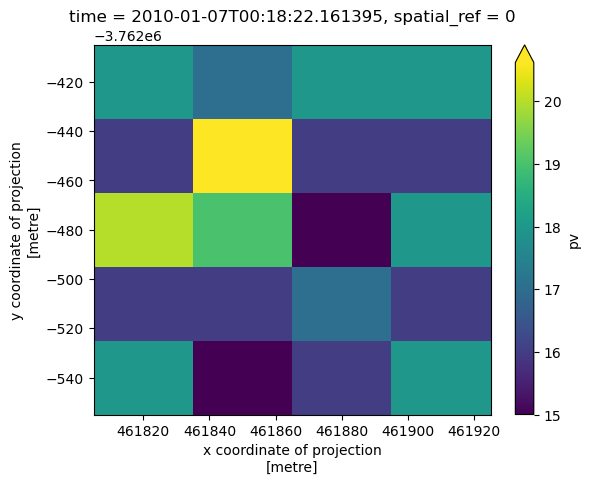

In [55]:
fc_clip['pv'].isel(time=0).plot(robust=True, add_colorbar=True)

In [56]:
# Assuming ds is your xarray dataset
# For example, if ds has dimensions (time, y, x) and you want the first time step:
first_image = fc_clip.isel(time=0)
first_image

<xarray.Dataset> Size: 404B
Dimensions:      (y: 5, x: 4)
Coordinates:
  * y            (y) float64 40B -3.762e+06 -3.762e+06 ... -3.763e+06 -3.763e+06
  * x            (x) float64 32B 4.618e+05 4.618e+05 4.619e+05 4.619e+05
    time         datetime64[ns] 8B 2010-01-07T00:18:22.161395
    spatial_ref  int32 4B 0
Data variables:
    bs           (y, x) float32 80B 37.0 36.0 37.0 36.0 ... 37.0 42.0 39.0 36.0
    pv           (y, x) float32 80B 18.0 17.0 18.0 18.0 ... 18.0 15.0 16.0 18.0
    npv          (y, x) float32 80B 43.0 45.0 44.0 45.0 ... 44.0 41.0 44.0 45.0
    ue           (y, x) float32 80B 10.0 10.0 10.0 10.0 ... 9.0 9.0 10.0 9.0

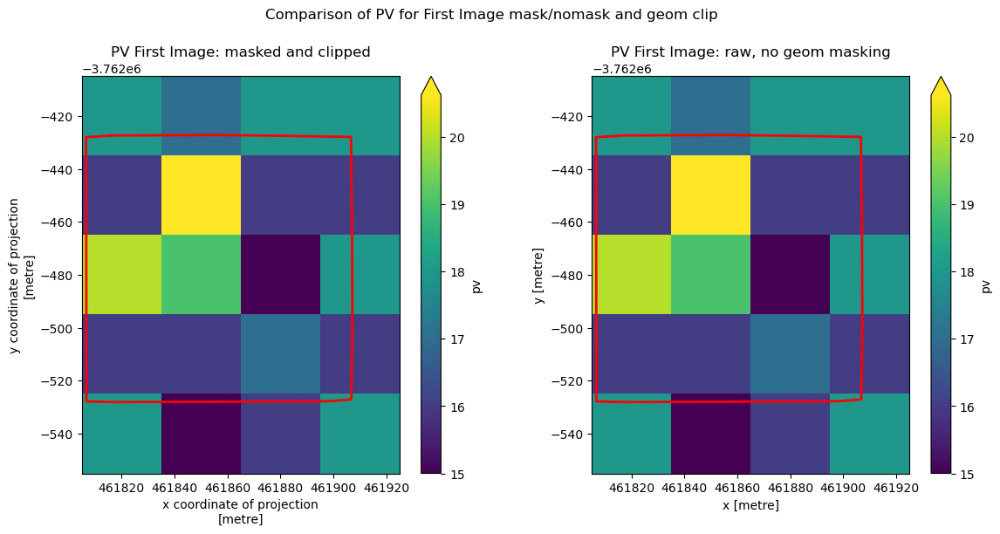

In [57]:
# Create a figure with two subplots (1 row, 2 columns)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))  # Adjust the size as needed

# Plot the first image (first_image.pv) on the first subplot (ax[0])
fc_clip.isel(time=0).pv.plot(robust=True, ax=ax[0])
ax[0].set_title('PV First Image: masked and clipped')

# Overlay the target_row geometry on the first subplot
gdf_reprojected.boundary.plot(ax=ax[0], color='red', linewidth=2)

# Plot the second image (fc.isel(time=0).pv) on the second subplot (ax[1])
fc.isel(time=0).pv.plot(robust=True, ax=ax[1])
ax[1].set_title('PV First Image: raw, no geom masking')

# Overlay the target_row geometry on the second subplot
gdf_reprojected.boundary.plot(ax=ax[1], color='red', linewidth=2)

# Set a main title for the entire figure
fig.suptitle('Comparison of PV for First Image mask/nomask and geom clip')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.subplots_adjust(top=0.85)  # Adjust the top to make space for the suptitle

# Show the plot
plt.show()



## Part 8: Perform spatial and temporal aggregation to generate time series 

### 8.1 First perform temporal aggregation, and then perform spatial aggregation. (TEST other way as well?) 

In [58]:
# Temporal aggregation: Resample by month and compute the median for each month
monthly_medians = fc_clip.resample(time='1MS').median(dim='time', skipna=True)
monthly_medians

<xarray.Dataset> Size: 59kB
Dimensions:      (time: 179, y: 5, x: 4)
Coordinates:
  * y            (y) float64 40B -3.762e+06 -3.762e+06 ... -3.763e+06 -3.763e+06
  * x            (x) float64 32B 4.618e+05 4.618e+05 4.619e+05 4.619e+05
    spatial_ref  int32 4B 0
  * time         (time) datetime64[ns] 1kB 2010-01-01 2010-02-01 ... 2024-11-01
Data variables:
    bs           (time, y, x) float32 14kB 37.0 36.0 36.0 ... 57.5 54.0 49.5
    pv           (time, y, x) float32 14kB 16.5 15.5 17.0 ... 15.5 16.5 17.0
    npv          (time, y, x) float32 14kB 44.5 46.5 45.0 ... 26.0 28.0 31.5
    ue           (time, y, x) float32 14kB 9.5 9.0 9.5 9.0 ... 8.0 8.0 8.5 9.0

In [59]:
monthly_medians.pv[0].compute()

<xarray.DataArray 'pv' (y: 5, x: 4)> Size: 80B
array([[16.5, 15.5, 17. , 14. ],
       [16. , 18. , 15.5, 15.5],
       [17. , 18. , 15. , 16.5],
       [16. , 16. , 15.5, 15. ],
       [16.5, 14. , 14. , 16. ]], dtype=float32)
Coordinates:
  * y            (y) float64 40B -3.762e+06 -3.762e+06 ... -3.763e+06 -3.763e+06
  * x            (x) float64 32B 4.618e+05 4.618e+05 4.619e+05 4.619e+05
    spatial_ref  int32 4B 0
    time         datetime64[ns] 8B 2010-01-01

In [60]:
# Spatial aggregation: Compute the spatial median (median over 'x' and 'y')
monthly_medians_time_series = monthly_medians.median(dim=('y', 'x')) 

In [61]:
monthly_medians_time_series

<xarray.Dataset> Size: 4kB
Dimensions:      (time: 179)
Coordinates:
    spatial_ref  int32 4B 0
  * time         (time) datetime64[ns] 1kB 2010-01-01 2010-02-01 ... 2024-11-01
Data variables:
    bs           (time) float32 716B 38.25 32.5 34.75 39.5 ... 56.5 54.0 54.0
    pv           (time) float32 716B 16.0 18.0 18.5 16.5 ... 15.0 15.25 15.0
    npv          (time) float32 716B 44.75 47.0 45.5 41.75 ... 27.0 28.75 29.5
    ue           (time) float32 716B 9.0 10.0 9.5 9.5 10.25 ... 9.0 7.0 7.5 8.25

In [62]:
# Since we are using dask, we need to compute the result to get it as a numpy array
time_series_pv = monthly_medians_time_series['pv'].compute()
time_series_pv

<xarray.DataArray 'pv' (time: 179)> Size: 716B
array([16.  , 18.  , 18.5 , 16.5 , 20.5 ,   nan, 22.  , 19.75,   nan,
       16.25, 19.5 , 23.  , 24.  , 30.  , 31.  , 31.  ,   nan,   nan,
       35.  , 30.25, 26.5 , 25.  , 25.  , 24.  ,   nan, 28.  , 32.  ,
       32.  , 35.  ,   nan, 34.  , 29.  , 25.5 , 25.25, 20.5 , 22.  ,
       22.25, 23.  , 25.  , 25.  , 32.  , 30.  , 30.5 , 26.  , 22.  ,
       20.  , 21.  , 19.25, 11.5 ,  5.  ,  5.  ,  3.75,  2.5 ,  6.  ,
        9.75,  9.5 , 12.  , 11.5 , 10.5 , 11.  , 11.25, 12.5 , 12.25,
       15.  , 17.5 , 22.  , 25.  , 21.  , 19.  , 16.  , 15.  , 15.  ,
       14.  , 14.75, 15.  , 15.  , 15.  , 17.  , 12.  , 13.  , 13.  ,
       14.  , 15.75, 13.  , 16.  , 16.  , 18.  , 19.  , 23.  , 23.5 ,
       22.  , 20.5 , 17.  , 16.5 , 16.  , 17.  , 16.5 , 18.  , 20.  ,
       21.  , 25.  , 25.5 , 24.5 , 21.5 , 16.5 , 17.  , 15.  , 16.  ,
       16.  , 17.  , 14.  , 18.  , 20.  , 19.  , 21.25, 19.25, 15.75,
       15.  , 14.  , 14.25, 15.  , 14.5 , 16.5 , 18.  , 18.  , 21.  ,
       18.25, 17.5 , 14.  ,  9.  , 16.5 , 17.5 , 19.  , 17.5 , 18.25,
       18.  , 23.25, 24.25, 22.75, 20.  , 16.5 , 13.75, 16.  , 15.5 ,
       16.  , 17.  , 19.5 , 19.25, 17.  , 19.  , 18.  , 15.75, 16.  ,
       18.  , 19.  , 23.  , 21.5 , 19.  , 19.  , 20.5 , 20.25, 24.  ,
       19.5 , 17.  , 15.  , 14.5 , 14.  , 16.  , 16.25, 16.  , 17.  ,
       19.  , 21.  , 23.5 ,   nan, 19.  , 15.  , 15.25, 15.  ],
      dtype=float32)
Coordinates:
    spatial_ref  int32 4B 0
  * time         (time) datetime64[ns] 1kB 2010-01-01 2010-02-01 ... 2024-11-01

In [63]:
time_series_npv = monthly_medians_time_series['npv'].compute()

In [64]:
time_series_bs = monthly_medians_time_series['bs'].compute()

In [65]:
time_series_ue = monthly_medians_time_series['ue'].compute()

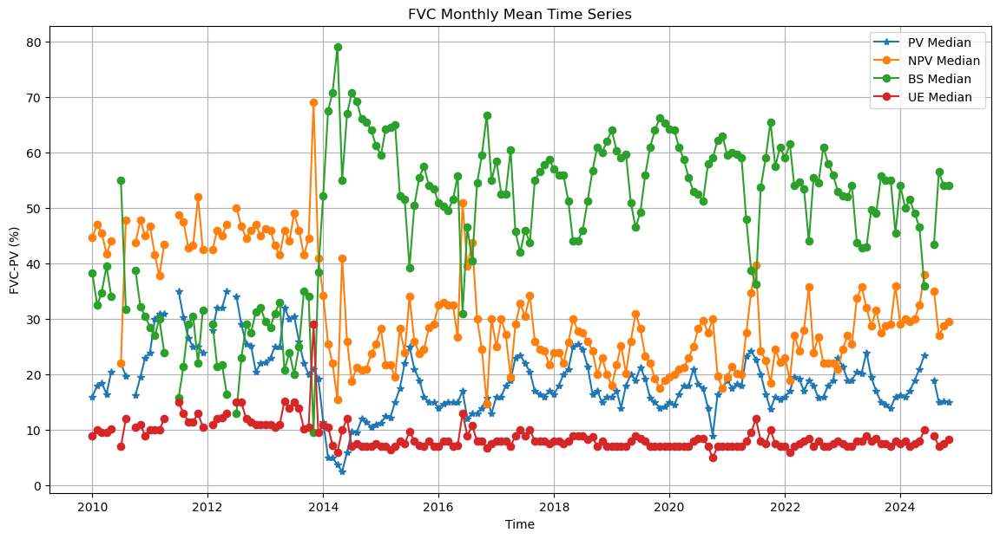

In [66]:
# Plot the time series
plt.figure(figsize=(14, 7))

plt.plot(time_series_pv['time'], time_series_pv, label='PV Median', marker='*')
plt.plot(time_series_pv['time'], time_series_npv, label='NPV Median', marker='o')
plt.plot(time_series_pv['time'], time_series_bs, label='BS Median', marker='o')
plt.plot(time_series_pv['time'], time_series_ue, label='UE Median', marker='o')

plt.xlabel('Time')
plt.ylabel('FVC-PV (%)')
plt.title('FVC Monthly Mean Time Series')
plt.legend()
plt.grid(True)
plt.show()

In [67]:
time_series_pv['time']

<xarray.DataArray 'time' (time: 179)> Size: 1kB
array(['2010-01-01T00:00:00.000000000', '2010-02-01T00:00:00.000000000',
       '2010-03-01T00:00:00.000000000', '2010-04-01T00:00:00.000000000',
       '2010-05-01T00:00:00.000000000', '2010-06-01T00:00:00.000000000',
       '2010-07-01T00:00:00.000000000', '2010-08-01T00:00:00.000000000',
       '2010-09-01T00:00:00.000000000', '2010-10-01T00:00:00.000000000',
       '2010-11-01T00:00:00.000000000', '2010-12-01T00:00:00.000000000',
       '2011-01-01T00:00:00.000000000', '2011-02-01T00:00:00.000000000',
       '2011-03-01T00:00:00.000000000', '2011-04-01T00:00:00.000000000',
       '2011-05-01T00:00:00.000000000', '2011-06-01T00:00:00.000000000',
       '2011-07-01T00:00:00.000000000', '2011-08-01T00:00:00.000000000',
       '2011-09-01T00:00:00.000000000', '2011-10-01T00:00:00.000000000',
       '2011-11-01T00:00:00.000000000', '2011-12-01T00:00:00.000000000',
       '2012-01-01T00:00:00.000000000', '2012-02-01T00:00:00.000000000',
       '2012-03-01T00:00:00.000000000', '2012-04-01T00:00:00.000000000',
       '2012-05-01T00:00:00.000000000', '2012-06-01T00:00:00.000000000',
       '2012-07-01T00:00:00.000000000', '2012-08-01T00:00:00.000000000',
       '2012-09-01T00:00:00.000000000', '2012-10-01T00:00:00.000000000',
       '2012-11-01T00:00:00.000000000', '2012-12-01T00:00:00.000000000',
       '2013-01-01T00:00:00.000000000', '2013-02-01T00:00:00.000000000',
       '2013-03-01T00:00:00.000000000', '2013-04-01T00:00:00.000000000',
       '2013-05-01T00:00:00.000000000', '2013-06-01T00:00:00.000000000',
       '2013-07-01T00:00:00.000000000', '2013-08-01T00:00:00.000000000',
       '2013-09-01T00:00:00.000000000', '2013-10-01T00:00:00.000000000',
       '2013-11-01T00:00:00.000000000', '2013-12-01T00:00:00.000000000',
       '2014-01-01T00:00:00.000000000', '2014-02-01T00:00:00.000000000',
       '2014-03-01T00:00:00.000000000', '2014-04-01T00:00:00.000000000',
       '2014-05-01T00:00:00.000000000', '2014-06-01T00:00:00.000000000',
       '2014-07-01T00:00:00.000000000', '2014-08-01T00:00:00.000000000',
       '2014-09-01T00:00:00.000000000', '2014-10-01T00:00:00.000000000',
       '2014-11-01T00:00:00.000000000', '2014-12-01T00:00:00.000000000',
       '2015-01-01T00:00:00.000000000', '2015-02-01T00:00:00.000000000',
       '2015-03-01T00:00:00.000000000', '2015-04-01T00:00:00.000000000',
       '2015-05-01T00:00:00.000000000', '2015-06-01T00:00:00.000000000',
       '2015-07-01T00:00:00.000000000', '2015-08-01T00:00:00.000000000',
       '2015-09-01T00:00:00.000000000', '2015-10-01T00:00:00.000000000',
       '2015-11-01T00:00:00.000000000', '2015-12-01T00:00:00.000000000',
       '2016-01-01T00:00:00.000000000', '2016-02-01T00:00:00.000000000',
       '2016-03-01T00:00:00.000000000', '2016-04-01T00:00:00.000000000',
       '2016-05-01T00:00:00.000000000', '2016-06-01T00:00:00.000000000',
       '2016-07-01T00:00:00.000000000', '2016-08-01T00:00:00.000000000',
       '2016-09-01T00:00:00.000000000', '2016-10-01T00:00:00.000000000',
       '2016-11-01T00:00:00.000000000', '2016-12-01T00:00:00.000000000',
       '2017-01-01T00:00:00.000000000', '2017-02-01T00:00:00.000000000',
       '2017-03-01T00:00:00.000000000', '2017-04-01T00:00:00.000000000',
       '2017-05-01T00:00:00.000000000', '2017-06-01T00:00:00.000000000',
       '2017-07-01T00:00:00.000000000', '2017-08-01T00:00:00.000000000',
       '2017-09-01T00:00:00.000000000', '2017-10-01T00:00:00.000000000',
       '2017-11-01T00:00:00.000000000', '2017-12-01T00:00:00.000000000',
       '2018-01-01T00:00:00.000000000', '2018-02-01T00:00:00.000000000',
       '2018-03-01T00:00:00.000000000', '2018-04-01T00:00:00.000000000',
       '2018-05-01T00:00:00.000000000', '2018-06-01T00:00:00.000000000',
       '2018-07-01T00:00:00.000000000', '2018-08-01T00:00:00.000000000',
       '2018-09-01T00:00:00.000000000', '2018-10-01T00:00:00.000000000',
       '2018-11-01T00:00:00.000000000', '2018-12-01T00:00:00.000000000',
       '20

In [68]:
time_series_pv

<xarray.DataArray 'pv' (time: 179)> Size: 716B
array([16.  , 18.  , 18.5 , 16.5 , 20.5 ,   nan, 22.  , 19.75,   nan,
       16.25, 19.5 , 23.  , 24.  , 30.  , 31.  , 31.  ,   nan,   nan,
       35.  , 30.25, 26.5 , 25.  , 25.  , 24.  ,   nan, 28.  , 32.  ,
       32.  , 35.  ,   nan, 34.  , 29.  , 25.5 , 25.25, 20.5 , 22.  ,
       22.25, 23.  , 25.  , 25.  , 32.  , 30.  , 30.5 , 26.  , 22.  ,
       20.  , 21.  , 19.25, 11.5 ,  5.  ,  5.  ,  3.75,  2.5 ,  6.  ,
        9.75,  9.5 , 12.  , 11.5 , 10.5 , 11.  , 11.25, 12.5 , 12.25,
       15.  , 17.5 , 22.  , 25.  , 21.  , 19.  , 16.  , 15.  , 15.  ,
       14.  , 14.75, 15.  , 15.  , 15.  , 17.  , 12.  , 13.  , 13.  ,
       14.  , 15.75, 13.  , 16.  , 16.  , 18.  , 19.  , 23.  , 23.5 ,
       22.  , 20.5 , 17.  , 16.5 , 16.  , 17.  , 16.5 , 18.  , 20.  ,
       21.  , 25.  , 25.5 , 24.5 , 21.5 , 16.5 , 17.  , 15.  , 16.  ,
       16.  , 17.  , 14.  , 18.  , 20.  , 19.  , 21.25, 19.25, 15.75,
       15.  , 14.  , 14.25, 15.  , 14.5 , 16.5 , 18.  , 18.  , 21.  ,
       18.25, 17.5 , 14.  ,  9.  , 16.5 , 17.5 , 19.  , 17.5 , 18.25,
       18.  , 23.25, 24.25, 22.75, 20.  , 16.5 , 13.75, 16.  , 15.5 ,
       16.  , 17.  , 19.5 , 19.25, 17.  , 19.  , 18.  , 15.75, 16.  ,
       18.  , 19.  , 23.  , 21.5 , 19.  , 19.  , 20.5 , 20.25, 24.  ,
       19.5 , 17.  , 15.  , 14.5 , 14.  , 16.  , 16.25, 16.  , 17.  ,
       19.  , 21.  , 23.5 ,   nan, 19.  , 15.  , 15.25, 15.  ],
      dtype=float32)
Coordinates:
    spatial_ref  int32 4B 0
  * time         (time) datetime64[ns] 1kB 2010-01-01 2010-02-01 ... 2024-11-01

In [69]:
# Replace values greater than 99.9 with NaN
time_series_pv[time_series_pv > 99] = np.nan

In [70]:
time_series_pv

<xarray.DataArray 'pv' (time: 179)> Size: 716B
array([16.  , 18.  , 18.5 , 16.5 , 20.5 ,   nan, 22.  , 19.75,   nan,
       16.25, 19.5 , 23.  , 24.  , 30.  , 31.  , 31.  ,   nan,   nan,
       35.  , 30.25, 26.5 , 25.  , 25.  , 24.  ,   nan, 28.  , 32.  ,
       32.  , 35.  ,   nan, 34.  , 29.  , 25.5 , 25.25, 20.5 , 22.  ,
       22.25, 23.  , 25.  , 25.  , 32.  , 30.  , 30.5 , 26.  , 22.  ,
       20.  , 21.  , 19.25, 11.5 ,  5.  ,  5.  ,  3.75,  2.5 ,  6.  ,
        9.75,  9.5 , 12.  , 11.5 , 10.5 , 11.  , 11.25, 12.5 , 12.25,
       15.  , 17.5 , 22.  , 25.  , 21.  , 19.  , 16.  , 15.  , 15.  ,
       14.  , 14.75, 15.  , 15.  , 15.  , 17.  , 12.  , 13.  , 13.  ,
       14.  , 15.75, 13.  , 16.  , 16.  , 18.  , 19.  , 23.  , 23.5 ,
       22.  , 20.5 , 17.  , 16.5 , 16.  , 17.  , 16.5 , 18.  , 20.  ,
       21.  , 25.  , 25.5 , 24.5 , 21.5 , 16.5 , 17.  , 15.  , 16.  ,
       16.  , 17.  , 14.  , 18.  , 20.  , 19.  , 21.25, 19.25, 15.75,
       15.  , 14.  , 14.25, 15.  , 14.5 , 16.5 , 18.  , 18.  , 21.  ,
       18.25, 17.5 , 14.  ,  9.  , 16.5 , 17.5 , 19.  , 17.5 , 18.25,
       18.  , 23.25, 24.25, 22.75, 20.  , 16.5 , 13.75, 16.  , 15.5 ,
       16.  , 17.  , 19.5 , 19.25, 17.  , 19.  , 18.  , 15.75, 16.  ,
       18.  , 19.  , 23.  , 21.5 , 19.  , 19.  , 20.5 , 20.25, 24.  ,
       19.5 , 17.  , 15.  , 14.5 , 14.  , 16.  , 16.25, 16.  , 17.  ,
       19.  , 21.  , 23.5 ,   nan, 19.  , 15.  , 15.25, 15.  ],
      dtype=float32)
Coordinates:
    spatial_ref  int32 4B 0
  * time         (time) datetime64[ns] 1kB 2010-01-01 2010-02-01 ... 2024-11-01

### 8.2 Data query, gap analysis, filling/interpolation and smoothening 
In time series data interpolation, ensure interpolation is non-negative as PV fraction cannot be negative.
Alternate approaches such as data padding could be implemented to avoid negative values in interpolation, gap filling and smoothening using SG filtering approach.

In [71]:
time_series_pv

<xarray.DataArray 'pv' (time: 179)> Size: 716B
array([16.  , 18.  , 18.5 , 16.5 , 20.5 ,   nan, 22.  , 19.75,   nan,
       16.25, 19.5 , 23.  , 24.  , 30.  , 31.  , 31.  ,   nan,   nan,
       35.  , 30.25, 26.5 , 25.  , 25.  , 24.  ,   nan, 28.  , 32.  ,
       32.  , 35.  ,   nan, 34.  , 29.  , 25.5 , 25.25, 20.5 , 22.  ,
       22.25, 23.  , 25.  , 25.  , 32.  , 30.  , 30.5 , 26.  , 22.  ,
       20.  , 21.  , 19.25, 11.5 ,  5.  ,  5.  ,  3.75,  2.5 ,  6.  ,
        9.75,  9.5 , 12.  , 11.5 , 10.5 , 11.  , 11.25, 12.5 , 12.25,
       15.  , 17.5 , 22.  , 25.  , 21.  , 19.  , 16.  , 15.  , 15.  ,
       14.  , 14.75, 15.  , 15.  , 15.  , 17.  , 12.  , 13.  , 13.  ,
       14.  , 15.75, 13.  , 16.  , 16.  , 18.  , 19.  , 23.  , 23.5 ,
       22.  , 20.5 , 17.  , 16.5 , 16.  , 17.  , 16.5 , 18.  , 20.  ,
       21.  , 25.  , 25.5 , 24.5 , 21.5 , 16.5 , 17.  , 15.  , 16.  ,
       16.  , 17.  , 14.  , 18.  , 20.  , 19.  , 21.25, 19.25, 15.75,
       15.  , 14.  , 14.25, 15.  , 14.5 , 16.5 , 18.  , 18.  , 21.  ,
       18.25, 17.5 , 14.  ,  9.  , 16.5 , 17.5 , 19.  , 17.5 , 18.25,
       18.  , 23.25, 24.25, 22.75, 20.  , 16.5 , 13.75, 16.  , 15.5 ,
       16.  , 17.  , 19.5 , 19.25, 17.  , 19.  , 18.  , 15.75, 16.  ,
       18.  , 19.  , 23.  , 21.5 , 19.  , 19.  , 20.5 , 20.25, 24.  ,
       19.5 , 17.  , 15.  , 14.5 , 14.  , 16.  , 16.25, 16.  , 17.  ,
       19.  , 21.  , 23.5 ,   nan, 19.  , 15.  , 15.25, 15.  ],
      dtype=float32)
Coordinates:
    spatial_ref  int32 4B 0
  * time         (time) datetime64[ns] 1kB 2010-01-01 2010-02-01 ... 2024-11-01

In [72]:
# # and interpolate missing values. This creates a more robust timeseries
# monthly_filled = time_series_pv.interpolate_na("time", method="linear").bfill("time").ffill("time")

In [73]:
# monthly_filled

In [74]:
dt = pd.Series(time_series_pv)
# dt = df['pv']

In [75]:
time_series_pv2 = dt.interpolate(method='linear', limit_direction='both')

In [76]:
time_series_pv2

0      16.00
1      18.00
2      18.50
3      16.50
4      20.50
       ...  
174    21.25
175    19.00
176    15.00
177    15.25
178    15.00
Length: 179, dtype: float32

In [77]:
# Savitzky-Golay filtering
window_length = 3 # length of the filter window (number of coefficients)
polyorder = 1 # order of the polynomial to fit
smoothed_data13 = savgol_filter(time_series_pv2, window_length, polyorder)

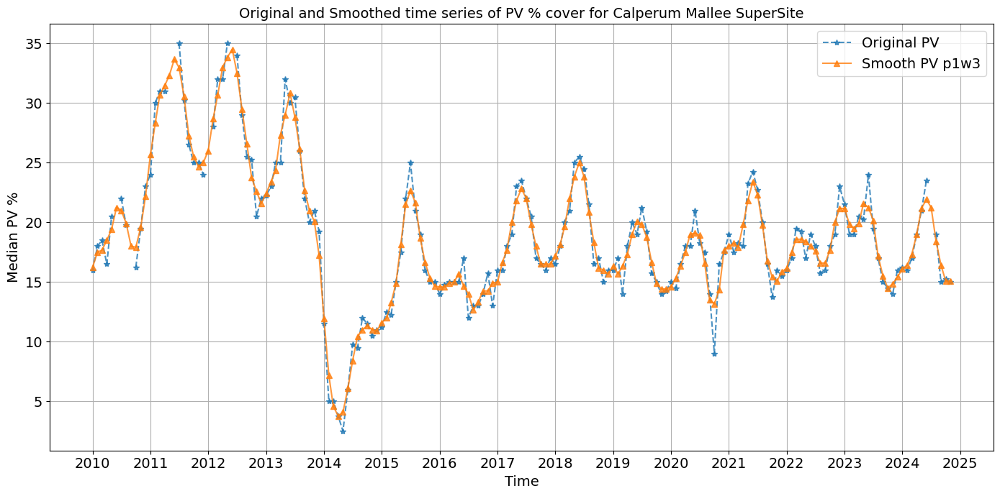

In [78]:
# Plot the original and smoothed data
plt.figure(figsize=(14, 7))
# # plt.plot(time_series_pv['time'], time_series_pv2, label='Gap filled)', linestyle='-', marker='^', alpha=0.8)
plt.plot(time_series_pv['time'], time_series_pv, label='Original PV', linestyle='--', marker='*', alpha=0.8)
plt.plot(time_series_pv['time'], smoothed_data13, label='Smooth PV p1w3', linestyle='-', marker='^', alpha=0.8)

import matplotlib.dates as mdates
# # Format the x-axis to show ticks for each year
# plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # Set major ticks to be once a year
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Format to show year

# # plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
# plt.tight_layout()  # Adjust layout for better fit
# plt.show()

# Set labels and title with increased font size
plt.xlabel('Time', fontsize=14)
plt.ylabel('Median PV %', fontsize=14)
plt.title('Original and Smoothed time series of PV % cover for Calperum Mallee SuperSite', fontsize=14)
plt.legend(fontsize=14)  # Increase legend font size
plt.grid(True)

# Format the x-axis to show ticks for each year
plt.gca().xaxis.set_major_locator(mdates.YearLocator())  # Set major ticks to be once a year
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Format to show year

plt.xticks(rotation=0, fontsize=14)  # Rotate x-axis labels and set font size
plt.yticks(fontsize=14)  # Set y-axis tick font size

plt.tight_layout()  # Adjust layout for better fit
# plt.savefig('Original and Smoothed %PV cover over time for Calperum Mallee SuperSite.png')
plt.show()

## Part 9: Extracting time series metrics

### Part 9.1 BEAST Analysis

In [79]:
import Rbeast as rb

In [80]:
# In the RBEAST function, the 'period' parameter represents the number of observations per seasonal cycle. 
# For monthly data, you should set period = 12, as there are 12 months in a year. 
# The current setting of period = 1 is incorrect for monthly data.

In [81]:
beast_pv13 = rb.beast(smoothed_data13, start=2010, deltat = '1/12 year', season='harmonic', tcp_minmax = [0,3], scp_minmax = [0,3], period = 1, print_options = 0)


Model fitted:  Y =  trend + season + error 

INFO: To supress messages, set print_param/print_warning/print_progresss = 0 in beast() and beast_irreg()
INFO: To supress messages, Set extra.printParameter/printWarning/printProgress = 0 in beast123()
INFO: To supress all messaages, set quiet=1 in beast() and beast_irreg() or extra.quiet=1 in beast123()

#--------------------------------------------------#
#       Brief summary of Input Data                #
#--------------------------------------------------#
Data Dimension: One signal of length 179
IsOrdered     : Yes, ordered in time
IsRegular     : Yes, evenly spaced at interval of  0.0833333 year = 1 months = 30.4167 days
HasSeasonCmpnt: True  | period = 1 year = 12 months = 365 days. The model 'Y=Trend+Season+Error' is fitted.
              : Num_of_DataPoints_per_Period = period/deltaTime = 1/0.0833333 = 12
HasOutlierCmpt: False | If true, Y=Trend+Season+Outlier+Error fitted instead of Y=Trend+Season+Error
Deseasonalize : False | I

In [82]:
# rb.plot(beast_pv13)

In [83]:
# rb.plot(beast_pv13, vars = ['st', 's', 'scp', 't', 'tcp','error' ], title='pv test 13')

C:\miniconda3\envs\ee\Lib\site-packages\Rbeast\plotbeast.py:336: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


(<Figure size 640x480 with 6 Axes>,
 array([<Axes: xlabel='[]', ylabel='Y'>,
        <Axes: xlabel='[]', ylabel='season'>,
        <Axes: xlabel='[]', ylabel='Pr(scp)'>,
        <Axes: xlabel='[]', ylabel='trend'>,
        <Axes: xlabel='[]', ylabel='Pr(tcp)'>,
        <Axes: xlabel='time', ylabel='error'>], dtype=object))

<Figure size 2000x1200 with 0 Axes>

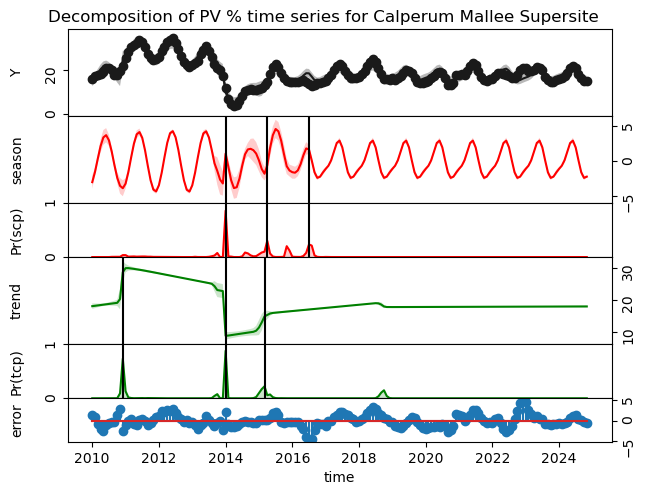

In [84]:
import matplotlib.pyplot as plt

# Adjust the figure size for better text clarity
plt.figure(figsize=(20, 12)) 

# Plot the time series decomposition
rb.plot(beast_pv13, 
        vars=['st', 's', 'scp', 't', 'tcp', 'error'], 
        title='Decomposition of PV % time series for Calperum Mallee Supersite')

# # Save the figure with high resolution and ensure labels are readable
# plt.tight_layout()  # Ensures there is no text overlap
# plt.savefig('Median_PV_time_series_decomposition_for_Calperum_Mallee_Supersite.png', dpi=300)
# plt.show()

In [85]:
trend_cp13 = beast_pv13.trend.cp
trend_cppr13 = beast_pv13.trend.cpPr
season_cp13 = beast_pv13.season.cp
season_cppr13 = beast_pv13.season.cpPr
print(trend_cp13)
print(trend_cppr13)
print(season_cp13)
print(season_cppr13)

[2014.     2010.9166 2015.1666]
[1.         0.97433335 0.65404177]
[2014.   2015.25 2016.5 ]
[0.9829167  0.62874997 0.5775    ]


In [86]:
from datetime import datetime, timedelta

def decimal_year_to_date(decimal_year):
    year = int(decimal_year)
    remainder = decimal_year - year
    base_date = datetime(year, 1, 1)
    delta = timedelta(days=(remainder * 365.25))
    return base_date + delta

# Example usage

trend_cp13_yyddmm = [decimal_year_to_date(date).strftime('%Y-%m-%d') for date in trend_cp13]
season_cp13_yyddmm = [decimal_year_to_date(date).strftime('%Y-%m-%d') for date in season_cp13]

print(trend_cp13_yyddmm)
print(season_cp13_yyddmm)


['2014-01-01', '2010-12-01', '2015-03-02']
['2014-01-01', '2015-04-02', '2016-07-01']


### Part 9.2 Perform stats based time series decomposition

In [87]:
from statsmodels.tsa.seasonal import seasonal_decompose
dec13 = seasonal_decompose(smoothed_data13, model='additive', period=12)

In [88]:
# dec13.plot()

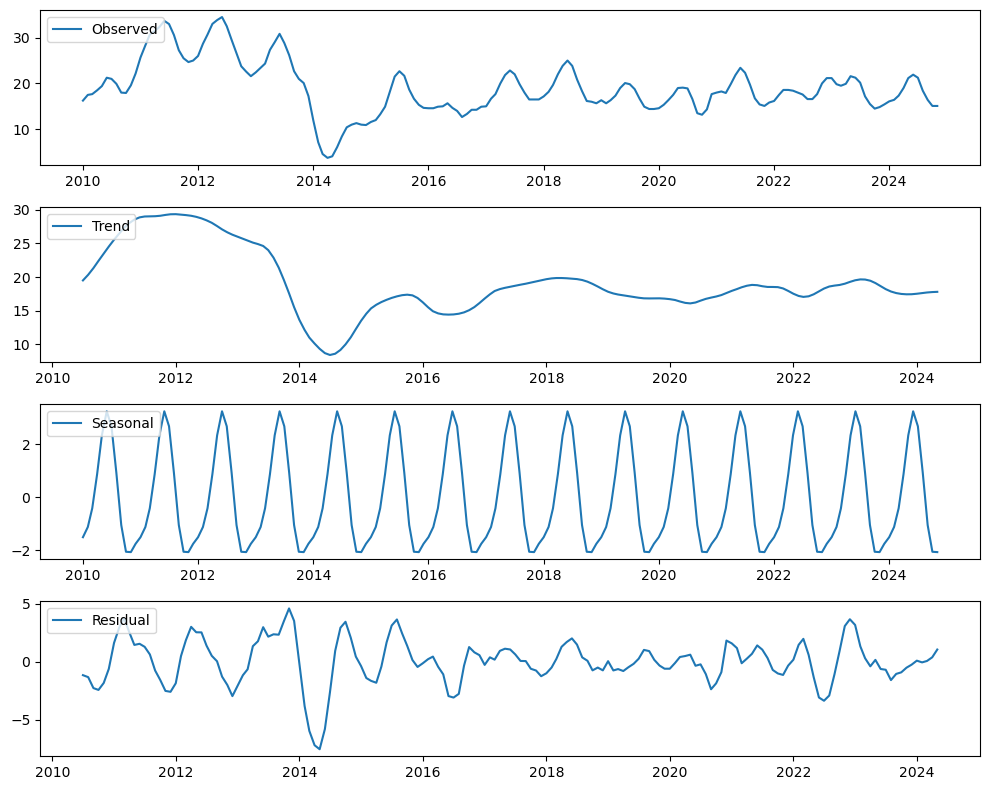

In [89]:
# Plot decomposed components
plt.figure(figsize=(10, 8))
plt.subplot(411)
plt.plot(time_series_pv['time'], dec13.observed, label='Observed')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(time_series_pv['time'], dec13.trend, label='Trend')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(time_series_pv['time'], dec13.seasonal, label='Seasonal')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(time_series_pv['time'], dec13.resid, label='Residual')
plt.legend(loc='upper left')
plt.tight_layout()

## 9.3 Mann Kendall Trend test analysis 

In [90]:
import pymannkendall as mk

In [91]:
ndvi_mk_r = mk.original_test(smoothed_data13)

In [92]:
MK_trend_value = ndvi_mk_r.Tau,
MK_trend = ndvi_mk_r.trend,
MK_slope = ndvi_mk_r.slope,
MK_p_value = ndvi_mk_r.p,
MK_intercept = ndvi_mk_r.intercept

print(MK_trend_value, MK_trend, MK_slope, MK_p_value, MK_intercept)

(-0.14682066411399158,) ('decreasing',) (-0.023737369884144176,) (0.003534996912766264,) 20.27929195057262


## Part 10: Time series visualisation using radial and spiral 
https://knowledge.dea.ga.gov.au/notebooks/How_to_guides/Detecting_seasonality/

## Part 10.1: Simple polar plots 

In [93]:
smoothed_data13

array([16.25     , 17.5      , 17.666666 , 18.5      , 19.416666 ,
       21.25     , 21.       , 19.916666 , 18.       , 17.916666 ,
       19.583334 , 22.166666 , 25.666666 , 28.333334 , 30.666666 ,
       31.444445 , 32.333332 , 33.666668 , 32.97222  , 30.583334 ,
       27.25     , 25.5      , 24.666666 , 25.       , 26.       ,
       28.666666 , 30.666666 , 33.       , 33.833332 , 34.5      ,
       32.5      , 29.5      , 26.583334 , 23.75     , 22.583334 ,
       21.583334 , 22.416666 , 23.416666 , 24.333334 , 27.333334 ,
       29.       , 30.833334 , 28.833334 , 26.166666 , 22.666666 ,
       21.       , 20.083334 , 17.25     , 11.916667 ,  7.1666665,
        4.5833335,  3.75     ,  4.0833335,  6.0833335,  8.416667 ,
       10.416667 , 11.       , 11.333333 , 11.       , 10.916667 ,
       11.583333 , 12.       , 13.25     , 14.916667 , 18.166666 ,
       21.5      , 22.666666 , 21.666666 , 18.666666 , 16.666666 ,
       15.333333 , 14.666667 , 14.583333 , 14.583333 , 14.9166

In [94]:
len(smoothed_data13)

179

In [95]:
site_id = 'Calperum'

In [96]:
# Spiral plot for single data col 
def plot_spiral():
    '''
    FUnction to produce spital plot of given time series data 
    '''
    norm = mcolors.Normalize(vmin=data['data_pv_ts_gfsg13'].min(), vmax=data['data_pv_ts_gfsg13'].max())
    cmap = matplotlib.colormaps.get_cmap("viridis")

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': 'polar'})
    r_min, radius_increment = 1.0, 0.5
    bar_width = (2 * np.pi) / 12
    # Determine font size based on the number of years for readability
    year_font_size = 12 if len(data['Year'].unique()) <= 10 else 10
    
    for i, (year, year_data) in enumerate(data.groupby('Year')):
        r = r_min + i * radius_increment
        for j, (month, month_data) in enumerate(year_data.groupby('Month')):
            value = month_data['data_pv_ts_gfsg13'].values[0]
            color = cmap(norm(value))
            ax.bar(j * bar_width, radius_increment * 0.5, color=color, edgecolor='black', linewidth=0.3, bottom=r, width=bar_width)
        ax.text(np.pi / 2, r + radius_increment * 0.25, str(year), ha='center', va='center', color='black', fontsize=10, weight='bold')
    # Month labels around the edge with adjusted positioning
    months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']    
    for i, month in enumerate(calendar.month_abbr[1:]):
        angle = i * bar_width
        ax.text(angle, r_min + (len(data['Year'].unique()) + 1) * radius_increment, month, ha='center', va='center', color='black', fontsize=14)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    plt.colorbar(sm, ax=ax, pad=0.10, shrink=0.8).set_label("PV %")
    plt.title("PV % Spiral Plot", fontsize=14, pad=30) # weight='bold', 
    plt.title(f"Monthly PV % for {site_id}", fontsize=16, pad=30)  # Moved title up with increased pad
    ax.set_xticks([])  # Remove angular ticks
    ax.set_yticks([])  # Remove radial ticks
    # Improve layout to prevent overlap
    plt.tight_layout()
    # plt.savefig(os.path.join(output_dir, f'{site_id}_PV %_spiral_plot.png'), dpi=300)
    # plt.close()

# plot_spiral()

In [97]:
# Implement  specific logic for radial ticks based on the presence of negative values, 
# we need to adjust the radial tick logic dynamically:

# If there are negative values (mean - std): Start the radial ticks from 0 upwards.
# If there are no negative values (mean - std): Start the radial ticks from radial_min and align them to multiples of 10.


def polar_seas_mean():
    '''
    Function to plot radial plot showing mean and +/-1 stdev of time series data.

    Additional implementation: 
    Implement  specific logic for radial ticks based on the presence of negative values, 
    we need to adjust the radial tick logic dynamically:
    
    If there are negative values (mean - std): Start the radial ticks from 0 upwards.
    If there are no negative values (mean - std): Start the radial ticks from radial_min and align them to multiples of 10.
    '''
    time_angle = 2 * np.pi * (ts.index.month / 12)
    # Bin the data: calculate mean and standard deviation for each month
    binned_mean = scipy.stats.binned_statistic(time_angle, ts.values, bins=n_bins)
    binned_stdev = scipy.stats.binned_statistic(time_angle, ts.values, bins=n_bins, statistic="std")
    
    # Extract bin edges and ensure lengths match
    bin_edges = binned_mean.bin_edges
    mean = binned_mean.statistic
    stdev = binned_stdev.statistic
    
    # Close the circle for polar plot
    theta = np.linspace(0, 2 * np.pi, n_bins + 1)  # Uniformly spaced for 12 months
    mean = np.append(mean, mean[0])  # Repeat the first value to close the circle
    stdev = np.append(stdev, stdev[0])  # Repeat the first value to close the circle
    
    # Create a polar plot
    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
    
    # Plot mean values
    ax.plot(theta, mean, label="Mean")
    
    # Fill area between mean ± standard deviation
    ax.fill_between(theta, mean - stdev, mean + stdev, alpha=0.2, label="Mean ± Stdev")
    
    # Calculate radial limits based on full range of data (including negative values)
    raw_radial_min = np.nanmin(mean - stdev)
    raw_radial_max = np.nanmax(mean + stdev)
    
    # Adjust radial_min and radial_max to nearest multiple of 10
    if raw_radial_min > 0:
        # Start from the nearest lower multiple of 10 if all values are positive
        radial_min = 10 * np.floor(raw_radial_min / 10)
    else:
        # Include negative values if present, rounded down to the nearest multiple of 10
        radial_min = 10 * np.floor(raw_radial_min / 10)
    
    # Round radial_max up to the nearest multiple of 10
    radial_max = 10 * np.ceil(raw_radial_max / 10)
    
    # Set radial limits
    ax.set_rlim(radial_min, radial_max)
    
    # Set radial ticks dynamically
    interval = 10  # Define the interval for radial ticks
    if radial_min < 0:
        # If there are negative values, start ticks from 0
        yticks = range(0, int(radial_max) + interval, interval)
    else:
        # If all values are positive, start ticks from radial_min
        yticks = list(range(int(radial_min), int(radial_max) + interval, interval))
    
    ax.set_yticks(yticks)
    ax.set_yticklabels([str(i) for i in yticks], fontsize=8)  # Set tick labels
    
    # Set radial grid lines to dashed
    ax.yaxis.grid(True, linestyle='--', linewidth=0.7)
    
    # Set month names as angular ticks
    ax.set_xticks(np.linspace(0, 2 * np.pi, 12, endpoint=False))
    ax.set_xticklabels(calendar.month_abbr[1:], fontsize=10, rotation=45)
 
    # # Add title
    # plt.title(f"Polar plot of PV % time series data for {site_id}", fontsize=10)
    plt.title(f"Polar plot of PV % time series data", fontsize=10)
    
    # Position legend in the top-right corner
    ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.05), fontsize=8)  # Adjust position to avoid overlapping the plot
    
    # # Save the plot
    # plt.savefig(os.path.join(output_dir, f'{site_id}_polar_seasonal_mean_rescaled_plot.png'), dpi=300)
    # plt.close()


In [98]:
# Convert strings to datetime objects
start_date = datetime.strptime(start_date, "%Y-%m-%d") if isinstance(start_date, str) else start_date
end_date = datetime.strptime(end_date, "%Y-%m-%d") if isinstance(end_date, str) else end_date
date_list = pd.date_range(start_date, end_date, freq='MS')


# Create DataFrame
data = pd.DataFrame({
    'Date': date_list,
    'data_pv_ts_gfsg13': smoothed_data13
})
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)
data['Year'] = data.index.year
data['Month'] = data.index.month

# Calculate monthly means and standard deviations
monthly_stats = data.groupby('Month')['data_pv_ts_gfsg13'].agg(['mean', 'std']).reset_index()

# Extract values for plotting
x = monthly_stats['Month']  # Months (1-12)
monthly_means = monthly_stats['mean']
monthly_stds = monthly_stats['std']


# Step 3: Create a Pandas Series
time_series = pd.Series(smoothed_data13, index=date_list)
ts = time_series

# Define number of bins (12 months)
n_bins = 12

Calling print function for seasonality plots
calling plot_spiral()


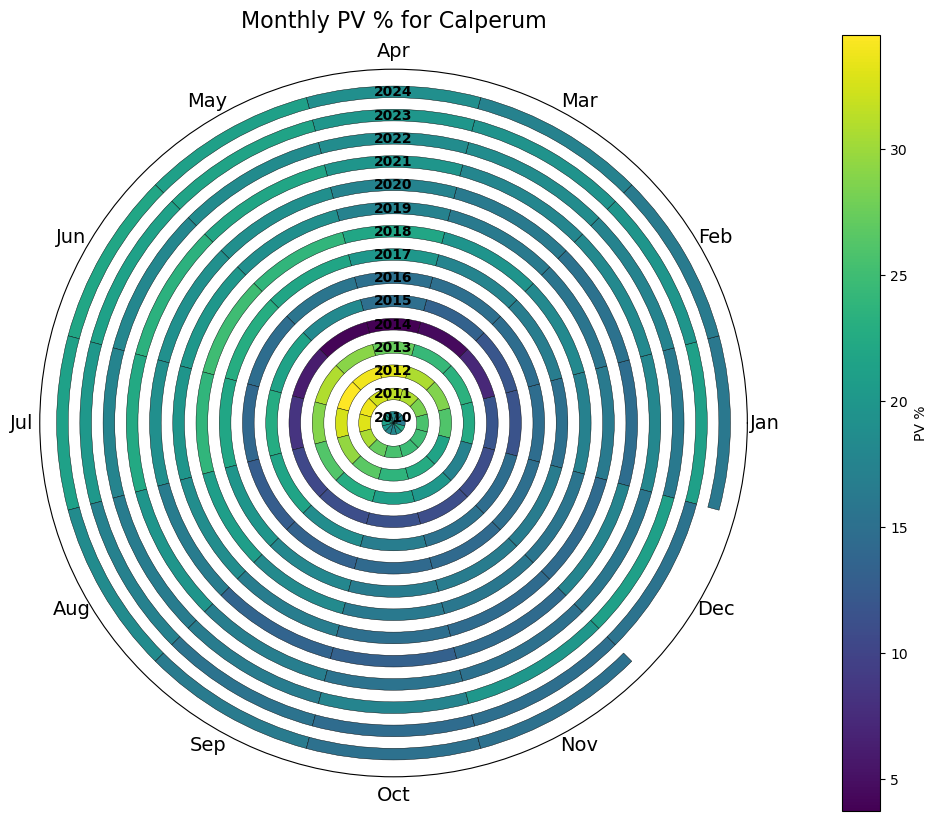

In [99]:
print(f"Calling print function for seasonality plots")
# Call all plot functions

print(f"calling plot_spiral()")
plot_spiral()

calling polar_seas_mean()


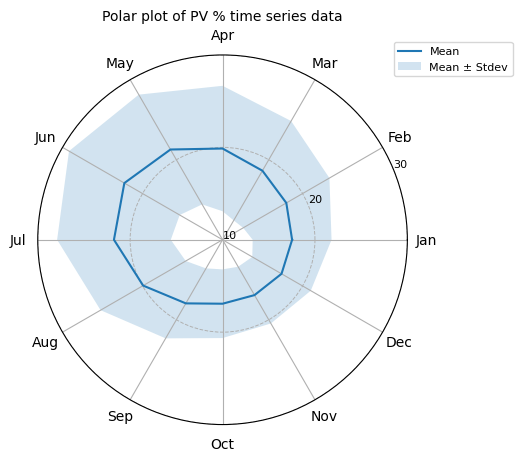

In [100]:
print(f"calling polar_seas_mean()")
polar_seas_mean()

# 12. OPTIONAL PLOTS

#### OPTIONAL 1: To produce spiral animation time series plot

In [101]:
# fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': 'polar'})
# ax.set_ylim(0, data['data_pv_ts_gfsg13'].max() + 10)  # Set limits based on your data range
# ax.set_xticks(np.linspace(0, 2 * np.pi, 12, endpoint=False))
# ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# line, = ax.plot([], [], lw=2, color='orange')
# scatter = ax.scatter([], [], s=50, color='red')  # To mark the current month

# def animate(i):
#     current_data = data.iloc[:i+1]
#     theta = 2 * np.pi * (current_data['Month'] - 1) / 12  # Convert month to angle
#     radii = current_data['data_pv_ts_gfsg13']
#     line.set_data(theta, radii)
#     scatter.set_offsets(np.c_[theta[-1:], radii[-1:]])  # Current point marker

#     # Add year text for each loop (optional)
#     ax.set_title(f"Year: {current_data['Year'].iloc[-1]}", va='bottom', fontsize=16)
#     return line, scatter

# ani = FuncAnimation(fig, animate, frames=len(data), interval=100, blit=True)


# # # To save the animation as a video file
# ani.save('FCV PV Calp spiral_v1-wa.mp4', 
#          writer='ffmpeg', 
#          dpi=150,
#          progress_callback=lambda i, n: print(f'Rendering frame {i+1}/{n}', end='\r'))

# # Or display inline (for Jupyter Notebooks)
# plt.show()

#### OPTIONAL 2: Test different data stretching and normalisation for better visualisation of spiral plot

In [102]:
# Remove NaN values before applying transformations
column_data = data['data_pv_ts_gfsg13'].dropna().values.reshape(-1, 1)

# Apply different scaling approaches
robust_scaled = RobustScaler(quantile_range=(25, 75)).fit_transform(column_data).flatten()

percentile_98_scaled = np.clip(column_data.flatten(),
                               np.percentile(column_data, 2),
                               np.percentile(column_data, 98))

iqr_stretch_scaled = np.clip(column_data.flatten(),
                             np.percentile(column_data, 25) - 1.5 * (np.percentile(column_data, 75) - np.percentile(column_data, 25)),
                             np.percentile(column_data, 75) + 1.5 * (np.percentile(column_data, 75) - np.percentile(column_data, 25)))

direct_normalization = column_data.flatten()

# Function to plot spiral chart
def plot_spiral(scaled_data, title):
    norm = mcolors.Normalize(vmin=scaled_data.min(), vmax=scaled_data.max())
    cmap = plt.cm.viridis

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': 'polar'})
    r_min, radius_increment = 1.0, 0.5
    bar_width = (2 * np.pi) / 12

    for i, (year, year_data) in enumerate(data.groupby('Year')):
        r = r_min + i * radius_increment
        for j, (month, month_data) in enumerate(year_data.groupby('Month')):
            value = scaled_data[i * 12 + j]  # Retrieve transformed value
            color = cmap(norm(value))
            ax.bar(j * bar_width, radius_increment * 0.5, color=color, edgecolor='black', linewidth=0.3, bottom=r, width=bar_width)
        ax.text(np.pi / 2, r + radius_increment * 0.25, str(year), ha='center', va='center', color='black', fontsize=10, weight='bold')

    # Month labels around the edge
    for i, month in enumerate(calendar.month_abbr[1:]):
        angle = i * bar_width
        ax.text(angle, r_min + (len(data['Year'].unique()) + 1) * radius_increment, month, ha='center', va='center', color='black', fontsize=14)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    plt.colorbar(sm, ax=ax, pad=0.10, shrink=0.8).set_label("PV %")
    plt.title(title, fontsize=16, pad=30)

    ax.set_xticks([])
    ax.set_yticks([])
    plt.tight_layout()
    plt.show()

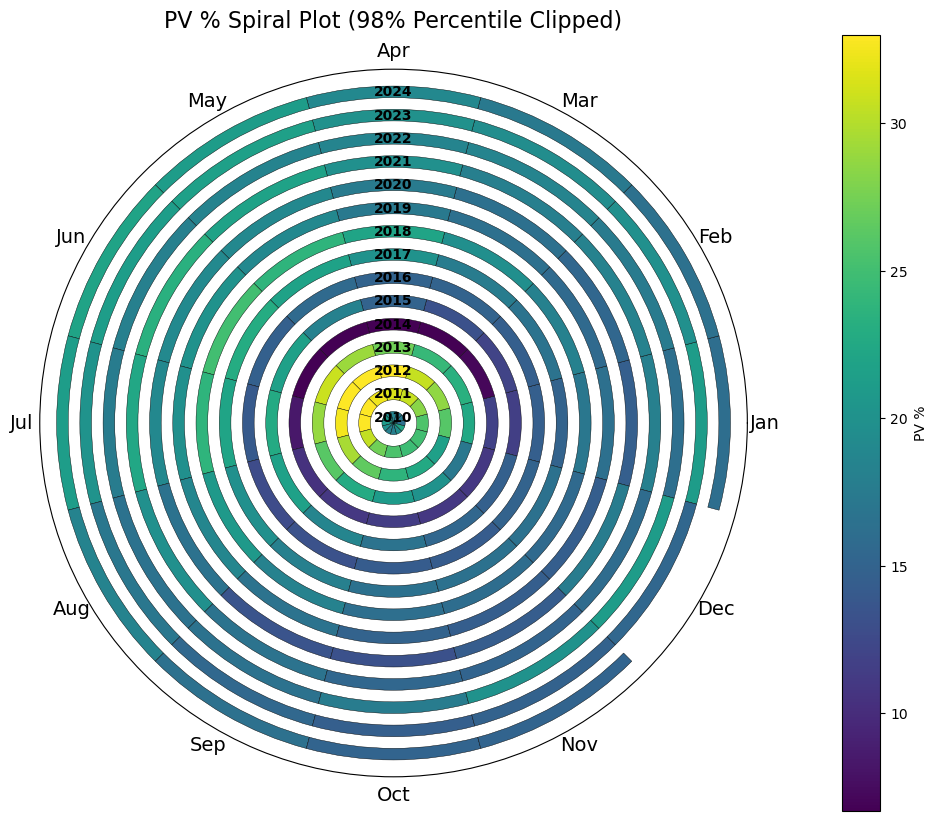

In [103]:
# # Generate plots for each scaling approach
# plot_spiral(robust_scaled, "PV % Spiral Plot (Robust Scaler)")
plot_spiral(percentile_98_scaled, "PV % Spiral Plot (98% Percentile Clipped)")

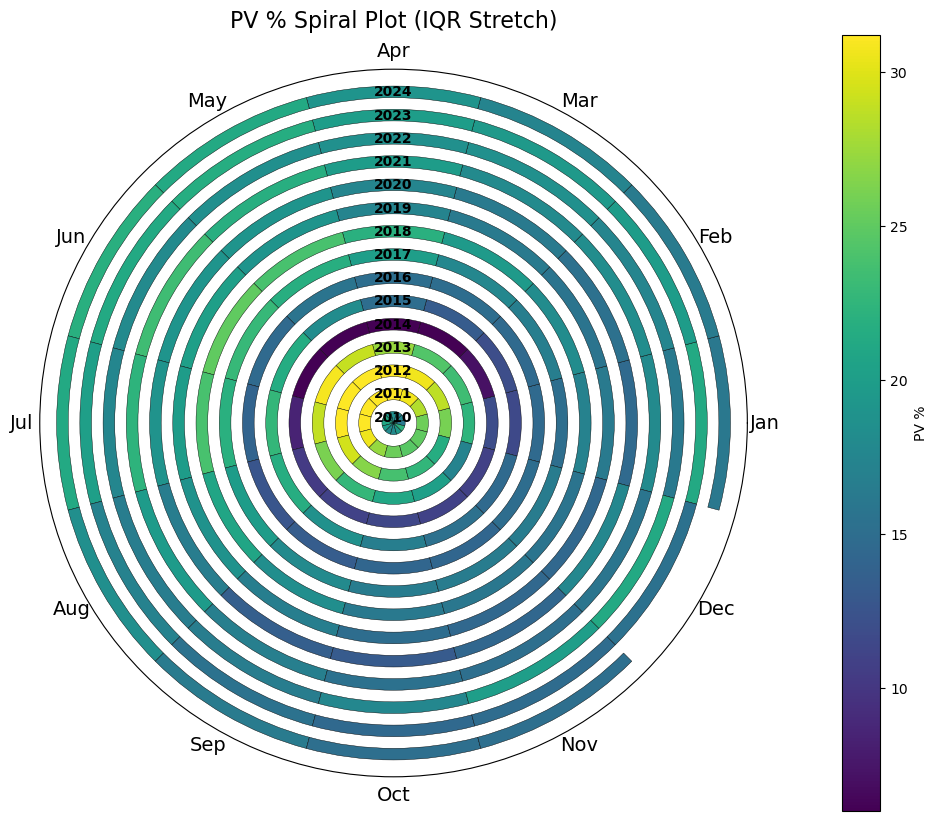

In [104]:
plot_spiral(iqr_stretch_scaled, "PV % Spiral Plot (IQR Stretch)")

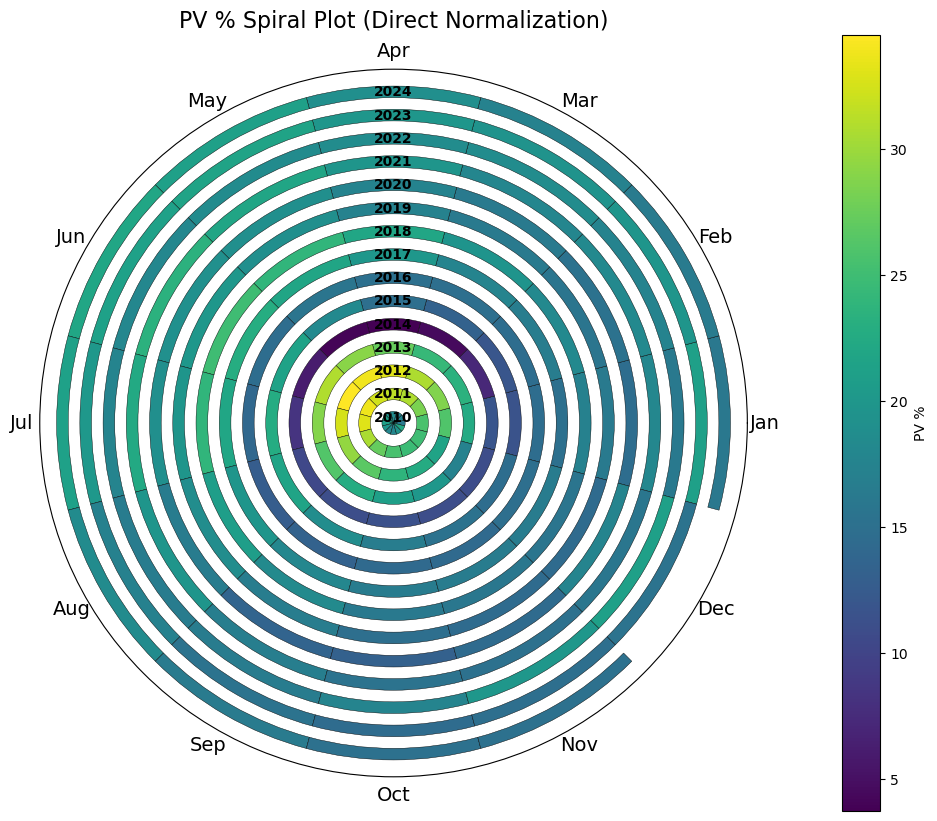

In [105]:
plot_spiral(direct_normalization, "PV % Spiral Plot (Direct Normalization)")

## End of notebook